# Analysis for best place to start a new restaurant in New York

### Importing the necessary libraries

In [2]:

!pip install geopy
!pip install bs4
!pip install lxml
!pip install wordcloud



     |████████████████████████████████| 112kB 6.8MB/s eta 0:00:01
     |████████████████████████████████| 112kB 2.8MB/s eta 0:00:01
  Stored in directory: /home/jupyterlab/.cache/pip/wheels/a0/b0/b2/4f80b9456b87abedbc0bf2d52235414c3467d8889be38dd472
Successfully built bs4
     |████████████████████████████████| 5.8MB 5.3MB/s eta 0:00:01     |█████                           | 880kB 5.3MB/s eta 0:00:01
     |████████████████████████████████| 368kB 5.7MB/s eta 0:00:01


In [3]:
import pandas as pd
import numpy as np

from geopy.geocoders import Nominatim
import folium
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

from bs4 import BeautifulSoup
import json
from pandas.io.json import json_normalize
import csv
import requests
import lxml


from PIL import Image

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.style.use('ggplot')

from wordcloud import WordCloud, STOPWORDS
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

Downloading the data

In [4]:
!wget -q -O 'newyork_data.json' https://ibm.box.com/shared/static/fbpwbovar7lf8p5sgddm06cgipa2rxpe.json

Exploring the data and returning it in a dataframe

In [5]:
with open('newyork_data.json') as j_data:
    NYK_data = json.load(j_data)
    
neighborhoods_data = NYK_data['features']
NYK_data['features'][0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

Transforming it into a DF

In [6]:
neighborhoods = pd.DataFrame(columns= ['Borough', 'Neighborhood', 'Latitude', 'Longitude'])

for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)
    
neighborhoods.shape    

(306, 4)

Getting the coordinates of New York using geopy

In [7]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="Jupyter")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude


Using Folium to show places on the map

In [8]:
map_NewYork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_NewYork)  
    
map_NewYork

<img src="1.PNG">

#### Population Density distribution

In [9]:
website_url = requests.get('https://en.wikipedia.org/wiki/Demographics_of_New_York_City')
soup = BeautifulSoup(website_url.content, 'html.parser')
table = soup.find('table',{'class':'wikitable sortable'})
#print(soup.prettify())

headers = [header.text for header in table.find_all('th')]

table_rows = table.find_all('tr')        
rows = []
for row in table_rows:
   td = row.find_all('td')
   row = [row.text for row in td]
   rows.append(row)

with open('BON2_POPULATION1.csv', 'w') as f:
   writer = csv.writer(f)
   writer.writerow(headers)
   writer.writerows(row for row in rows if row)

Pop_data=pd.read_csv('BON2_POPULATION1.csv')
Pop_data.drop(Pop_data.columns[[7,8,9,10,11]], axis=1,inplace=True)

Pop_data.columns = Pop_data.columns.str.replace(' ', '')
Pop_data.columns = Pop_data.columns.str.replace('\'','')
Pop_data.rename(columns={'Borough':'persons_sq_mi','County':'persons_sq_km'}, inplace=True)

Pop_data.rename(columns = {'NewYorkCitysfiveboroughsvte\n' : 'Borough',
                   'Jurisdiction\n':'County',
                   'Population\n':'Estimate_2017', 
                   'Landarea\n':'square_miles',
                    'Density\n':'square_km'}, inplace=True)



Pop_data['Borough']=Pop_data['Borough'].replace(to_replace='\n', value='', regex=True)
Pop_data['County']=Pop_data['County'].replace(to_replace='\n', value='', regex=True)
Pop_data['Estimate_2017']=Pop_data['Estimate_2017'].replace(to_replace='\n', value='', regex=True)
Pop_data['square_miles']=Pop_data['square_miles'].replace(to_replace='\n', value='', regex=True)
Pop_data['square_km']=Pop_data['square_km'].replace(to_replace='\n', value='', regex=True)
Pop_data['persons_sq_mi']=Pop_data['persons_sq_mi'].replace(to_replace='\n', value='', regex=True)


Pop_data_2 = Pop_data[['Borough','County','Estimate_2017','persons_sq_mi']]

Pop_data = Pop_data_2.drop([5,6,7], axis = 'index')

Pop_data.to_csv('NYK_POPULATION.csv',index=False)

Pop_data_2

,Borough,County,Estimate_2017,persons_sq_mi
0,The Bronx,Bronx,"1,432,132",109.04
1,Brooklyn,Kings,"2,582,830",183.42
2,Manhattan,New York,"1,628,701",59.13
3,Queens,Queens,"2,278,906",281.09
4,Staten Island,Richmond,"476,179",151.18
5,City of New York,"8,398,748",842.343,"28,188"
6,State of New York,"19,745,289","1,701.399",416.4
7,Sources:[14] and see individual borough articles,NaN,NaN,NaN


In [ ]:
# For Racial Data

## Cuisine in each borough

The data has been retrieved from the <a href="https://en.wikipedia.org/wiki/Cuisine_of_New_York_City">link text</a>
link to CSV: The data is saved in CSV file

In [11]:
nyc_cuisine = pd.read_csv('nyk_cuisine.csv', names = ['Borough', 'Cuisine'])
nyc_cuisine.head()

,Borough,Cuisine
0,The Bronx,"Mexican, Puerto Rican, Dominican, Korean"
1,The Bronx,"Italian, Albanian"
2,The Bronx,"Italian, Seafood"
3,The Bronx,"Italian, Albanian"
4,The Bronx,Filipino


## New York City cuisine maping 

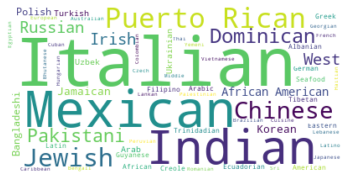

<Figure size 4320x6480 with 0 Axes>

In [12]:
nyc_cuisine_words = nyc_cuisine['Cuisine']

nyc_cuisine_words.to_csv('nyc_cusine_word.txt', sep = ',' , index = False)
nyc_cuisine_word = open('nyc_cusine_word.txt','r').read()
st_words= set(STOPWORDS)

nyc_cuisine_obj = WordCloud(background_color = 'white', max_words = 3000, stopwords = st_words)
nyc_cuisine_obj.generate(nyc_cuisine_word)

plt.imshow(nyc_cuisine_obj, interpolation='bilinear')
plt.axis('off')

fig = plt.figure()
fig.set_figwidth(60)
fig.set_figheight(90)

plt.show()

 Most popular food in New York city is
1. Italian
2. Mexican
3. Indian
4. Jewish
5. Puerto Rican

### The Bronx Cuisine

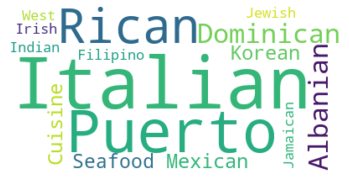

<Figure size 2160x3240 with 0 Axes>

In [13]:
brx_cuisine_df = nyc_cuisine[nyc_cuisine['Borough']== 'The Bronx'].reset_index(drop = True)

brx_cuisine_words = brx_cuisine_df['Cuisine']

brx_cuisine_words.to_csv('brx_cusine_word.txt', sep = ',' , index = False)
brx_cuisine_word = open('brx_cusine_word.txt','r').read()
st_words= set(STOPWORDS)

brx_cuisine_obj = WordCloud(background_color = 'white', max_words = 3000, stopwords = st_words)
brx_cuisine_obj.generate(brx_cuisine_word)

plt.imshow(brx_cuisine_obj, interpolation='bilinear')
plt.axis('off')

fig = plt.figure()
fig.set_figwidth(30)
fig.set_figheight(45)

plt.show()

 ##### Most liked food in The Bronx is
1. Italian
2. Puerto Rican
3. Dominican
4. Alabanian


### Queens Cuisine

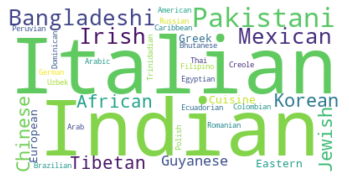

<Figure size 2160x3240 with 0 Axes>

In [14]:
que_cuisine_df = nyc_cuisine[nyc_cuisine['Borough']== 'Queens'].reset_index(drop = True)

que_cuisine_words = que_cuisine_df['Cuisine']

que_cuisine_words.to_csv('que_cusine_word.txt', sep = ',' , index = False)
que_cuisine_word = open('que_cusine_word.txt','r').read()
st_words= set(STOPWORDS)

que_cuisine_obj = WordCloud(background_color = 'white', max_words = 3000, stopwords = st_words)
que_cuisine_obj.generate(que_cuisine_word)

plt.imshow(que_cuisine_obj, interpolation='bilinear')
plt.axis('off')

fig = plt.figure()
fig.set_figwidth(30)
fig.set_figheight(45)

plt.show()

##### Most liked food in Queens is
1. Italian
2. Indian
3. Pakistani
4. Bangladeshi

### Manhattan Cuisine

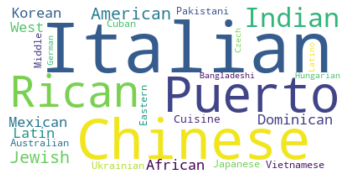

<Figure size 2160x3240 with 0 Axes>

In [15]:
man_cuisine_df = nyc_cuisine[nyc_cuisine['Borough']== 'Manhattan'].reset_index(drop = True)

man_cuisine_words = man_cuisine_df['Cuisine']

man_cuisine_words.to_csv('man_cusine_word.txt', sep = ',' , index = False)
man_cuisine_word = open('man_cusine_word.txt','r').read()
st_words= set(STOPWORDS)

man_cuisine_obj = WordCloud(background_color = 'white', max_words = 3000, stopwords = st_words)
man_cuisine_obj.generate(man_cuisine_word)

plt.imshow(man_cuisine_obj, interpolation='bilinear')
plt.axis('off')

fig = plt.figure()
fig.set_figwidth(30)
fig.set_figheight(45)

plt.show()

##### Most liked food in Manhattan is
1. Italian
2. Chinese
3. Puerto Rican
4. Jewish

### Staten Island

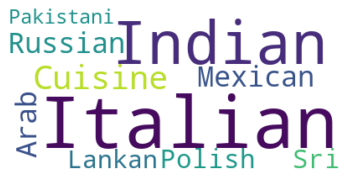

<Figure size 2160x3240 with 0 Axes>

In [16]:
sti_cuisine_df = nyc_cuisine[nyc_cuisine['Borough']== 'Staten Island'].reset_index(drop = True)

sti_cuisine_words = sti_cuisine_df['Cuisine']

sti_cuisine_words.to_csv('sti_cusine_word.txt', sep = ',' , index = False)
sti_cuisine_word = open('sti_cusine_word.txt','r').read()
st_words= set(STOPWORDS)

sti_cuisine_obj = WordCloud(background_color = 'white', max_words = 3000, stopwords = st_words)
sti_cuisine_obj.generate(sti_cuisine_word)

plt.imshow(sti_cuisine_obj, interpolation='bilinear')
plt.axis('off')

fig = plt.figure()
fig.set_figwidth(30)
fig.set_figheight(45)

plt.show()

##### Most liked food in Staten Island is
1. Italian
2. Indian
3. Sri Lankan , Mexican, Polish


# Brooklyn Cuisine

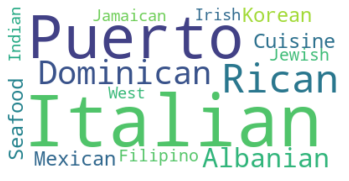

<Figure size 2160x3240 with 0 Axes>

In [17]:
broo_cuisine_df = nyc_cuisine[nyc_cuisine['Borough']== 'The Bronx'].reset_index(drop = True)

broo_cuisine_words = broo_cuisine_df['Cuisine']

broo_cuisine_words.to_csv('broo_cusine_word.txt', sep = ',' , index = False)
broo_cuisine_word = open('broo_cusine_word.txt','r').read()
st_words= set(STOPWORDS)

broo_cuisine_obj = WordCloud(background_color = 'white', max_words = 3000, stopwords = st_words)
broo_cuisine_obj.generate(broo_cuisine_word)

plt.imshow(broo_cuisine_obj, interpolation='bilinear')
plt.axis('off')

fig = plt.figure()
fig.set_figwidth(30)
fig.set_figheight(45)

plt.show()

##### Most liked food in Brooklyn is
1. Italian
2. Puerto Rican
3. Dominican
4. Albanian


In [18]:
!wget -q -O 'newyork_data.json' https://cocl.us/new_york_dataset

with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)
    
NYC_Geo_data = newyork_data['features']

column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 
NYC_Geo = pd.DataFrame(columns=column_names)

for data in NYC_Geo_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    NYC_Geo = NYC_Geo.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)


#### Foursquare Credentials

In [19]:
CLIENT_ID = 'HISBK1GZIJQIFBIPZJ0SYLGWCQZAUCEKF3UWPF4CXTH5O3AH' # your Foursquare ID
CLIENT_SECRET = 'NEADVQ35VFHOXAL1XL52YRZXLCHMWYYZDZACGJB5DZAZXXGQ' # your Foursquare Secret
VERSION = '20181218' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: HISBK1GZIJQIFBIPZJ0SYLGWCQZAUCEKF3UWPF4CXTH5O3AH
CLIENT_SECRET:NEADVQ35VFHOXAL1XL52YRZXLCHMWYYZDZACGJB5DZAZXXGQ


#### Clustering Neighbodhood of Brooklyn and Manhattan

In [20]:
BM_Geo = NYC_Geo.loc[(NYC_Geo['Borough'] == 'Brooklyn')|(NYC_Geo['Borough'] == 'Manhattan')]
BM_Geo = BM_Geo.reset_index(drop=True)

address = 'New York City, NY'

geolocator = Nominatim(user_agent="Jupyter")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude


###### Maps representation using folium 

In [21]:
map_BM = folium.Map(location=[latitude, longitude], zoom_start=10)

for lat, lng, borough, neighborhood in zip(BM_Geo['Latitude'], BM_Geo['Longitude'], BM_Geo['Borough'], BM_Geo['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_BM)  
    
map_BM

<img src="2.PNG">

#### Exploring the neighborhoods

In [22]:
def getNearbyVenues(names, latitudes, longitudes, LIMIT=200, radius=1000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

def Venues_Map(Borough_name, Borough_neighborhoods):
    
    # Use geopy library to get the latitude and longitude values 
    geolocator = Nominatim(user_agent="Jupyter")
    Borough_location = geolocator.geocode(Borough_name) #'Brooklyn, NY'
    Borough_latitude = Borough_location.latitude
    Borough_longitude = Borough_location.longitude
    print('The geographical coordinates of "{}" are {}, {}.'.format(Borough_name, Borough_latitude, Borough_longitude))
    
    # To verify the number of Boroughs and Neighborhoods in the extracted data
    print('The "{}" dataframe has {} different venue types and {} neighborhoods.'.format(
          Borough_name,
          len(Borough_neighborhoods['VenueCategory'].unique()),
          len(Borough_neighborhoods['Neighborhood'].unique())))
    
    # create map of city using latitude and longitude values
    map_Borough = folium.Map(location=[Borough_latitude, Borough_longitude], zoom_start=10)

    # add markers to map
    for lat, lng, venue, category in zip(Borough_neighborhoods['VenueLatitude'], Borough_neighborhoods['VenueLongitude'], Borough_neighborhoods['Venue'], Borough_neighborhoods['VenueCategory']):
        label = '{}, {}'.format(category, venue)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=0.1,
            popup=label,
            color='red',
            fill=True,
            fill_color='#FF0000',
            fill_opacity=0.3).add_to(map_Borough)  

    return map_Borough

In [23]:
BM_venues = getNearbyVenues(names=BM_Geo['Neighborhood'],
                                  latitudes=BM_Geo['Latitude'],
                                  longitudes=BM_Geo['Longitude'],
                                  LIMIT=200)

print('The "BM_venues" dataframe has {} venues and {} unique venue types.'.format(
      len(BM_venues['Venue Category']),
      len(BM_venues['Venue Category'].unique())))

BM_venues.to_csv('BM_venues.csv', sep=',', encoding='UTF8')
BM_venues.head()

Marble Hill
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker Heights
Gerritsen Beach
Marine Park
Clinton Hill
Sea Gate
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Bergen Beach
Midwood
Prospect Park South
Georgetown
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Chinatown
Washington Heights
Inwood
Hamilton Heights
Manhattanville
Central Harlem
East Harlem
Upper East Side
Yorkville
Lenox Hill
Roosevelt Island
Upper West Side
Lincoln Square
Clinton
Midtown
Murray Hill
Chelsea
Greenwich Village
East Village
Lower East Side
Tribeca
Little Italy
Soho

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Marble Hill,40.876551,-73.91066,Bikram Yoga,40.876844,-73.906204,Yoga Studio
1,Marble Hill,40.876551,-73.91066,Arturo's,40.874412,-73.910271,Pizza Place
2,Marble Hill,40.876551,-73.91066,Tibbett Diner,40.880404,-73.908937,Diner
3,Marble Hill,40.876551,-73.91066,Sam's Pizza,40.879435,-73.905859,Pizza Place
4,Marble Hill,40.876551,-73.91066,Starbucks,40.877531,-73.905582,Coffee Shop


In [24]:
colnames = ['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude', 'Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category']
BM_venues = pd.read_csv('BM_venues.csv', skiprows=1, names=colnames)
BM_venues.columns = BM_venues.columns.str.replace(' ', '')
Venues_Map('New York City, NY', BM_venues)

The geographical coordinates of "New York City, NY" are 40.7127281, -74.0060152.
The "New York City, NY" dataframe has 408 different venue types and 110 neighborhoods.


<img src="3.PNG">


In [25]:
Check_venues = BM_venues.groupby('VenueCategory')['Venue'].count().sort_values(ascending=False)

Check_venues.head()

VenueCategory
Pizza Place           394
Coffee Shop           349
Park                  245
Italian Restaurant    242
Bakery                235
Name: Venue, dtype: int64

In [26]:
BM_venues.groupby('Neighborhood').count()

,NeighborhoodLatitude,NeighborhoodLongitude,Venue,VenueLatitude,VenueLongitude,VenueCategory
Neighborhood,,,,,,
Bath Beach,100,100,100,100,100,100
Battery Park City,100,100,100,100,100,100
Bay Ridge,100,100,100,100,100,100
Bedford Stuyvesant,100,100,100,100,100,100
Bensonhurst,100,100,100,100,100,100
...,...,...,...,...,...,...
West Village,100,100,100,100,100,100
Williamsburg,100,100,100,100,100,100
Windsor Terrace,97,97,97,97,97,97


In [27]:
print('There are {} uniques categories.'.format(len(BM_venues['VenueCategory'].unique())))

There are 408 uniques categories.


### Analysis of neigbhorhoods 

In [28]:
# one hot encoding
BM_onehot = pd.get_dummies(BM_venues[['VenueCategory']], prefix="", prefix_sep="")

#column lists before adding neighborhood
column_names = ['Neighborhood'] + list(BM_onehot.columns)

# add neighborhood column back to dataframe
BM_onehot['Neighborhood'] = BM_venues['Neighborhood'] 

# move neighborhood column to the first column
BM_onehot = BM_onehot[column_names]

restaurant_List = []
search = 'Restaurant'
for i in BM_onehot.columns :
    if search in i:
        restaurant_List.append(i)
        

col_name = []
col_name = ['Neighborhood'] + restaurant_List
BM_restaurant = BM_onehot[col_name]
BM_restaurant = BM_restaurant.iloc[:,1::]

BM_restaurant_grouped = BM_restaurant.groupby('Neighborhood').sum().reset_index()
BM_restaurant_grouped['Total'] = BM_restaurant_grouped .sum(axis=1)

In [29]:

BM_grouped_clustering = BM_restaurant_grouped.drop('Neighborhood', 1)

for n_cluster in range(2, 10):
    kmeans = KMeans(n_clusters=n_cluster).fit(BM_grouped_clustering)
    label = kmeans.labels_
    sil_coeff = silhouette_score(BM_grouped_clustering, label, metric='euclidean')
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(n_cluster, sil_coeff))

For n_clusters=2, The Silhouette Coefficient is 0.389583672694949
For n_clusters=3, The Silhouette Coefficient is 0.2845903489434789
For n_clusters=4, The Silhouette Coefficient is 0.2191815230812793
For n_clusters=5, The Silhouette Coefficient is 0.2233509604520946
For n_clusters=6, The Silhouette Coefficient is 0.22522775311954515
For n_clusters=7, The Silhouette Coefficient is 0.21564365182868267
For n_clusters=8, The Silhouette Coefficient is 0.1857163008827516
For n_clusters=9, The Silhouette Coefficient is 0.19933783640940878


In [30]:
# set number of clusters
kclusters = 2

BM_grouped_clustering = BM_restaurant_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(BM_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0,
       0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1,
       1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0,
       1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0],
      dtype=int32)

In [31]:

BM_results = pd.DataFrame(kmeans.cluster_centers_)
BM_results.columns = BM_grouped_clustering.columns
BM_results.index = ['cluster0','cluster1']
BM_results['Total Sum'] = BM_results.sum(axis = 1)
BM_results

,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Austrian Restaurant,Burmese Restaurant,Cajun / Creole Restaurant,Cambodian Restaurant,...,Thai Restaurant,Tibetan Restaurant,Turkish Restaurant,Udon Restaurant,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Total,Total Sum
cluster0,0.112903,1.709677,1.129032e-01,0.064516,0.435484,0.161290,0.064516,3.225806e-02,0.096774,0.048387,...,1.064516,0.048387,0.274194,0.048387,1.612903e-02,0.596774,1.612903e-02,0.483871,27.161290,54.322581
cluster1,0.062500,1.250000,2.775558e-17,0.062500,0.062500,0.020833,0.041667,-3.469447e-18,0.000000,0.000000,...,0.145833,0.000000,0.041667,0.000000,-1.734723e-18,0.208333,-1.734723e-18,0.083333,11.958333,23.916667


In [32]:
BM_results_merged = pd.DataFrame(BM_restaurant_grouped['Neighborhood'])

BM_results_merged['Total'] = BM_restaurant_grouped['Total']
BM_results_merged = BM_results_merged.assign(Cluster_Labels = kmeans.labels_)

print(BM_results_merged.shape)
BM_results_merged

(110, 3)


,Neighborhood,Total,Cluster_Labels
0,Bath Beach,33,0
1,Battery Park City,8,1
2,Bay Ridge,36,0
3,Bedford Stuyvesant,21,0
4,Bensonhurst,29,0
...,...,...,...
105,West Village,27,0
106,Williamsburg,25,0
107,Windsor Terrace,17,1
108,Wingate,13,1


In [33]:
BM_merged = BM_Geo

BM_merged = BM_merged.join(BM_results_merged.set_index('Neighborhood'), on='Neighborhood')

print(BM_merged.shape)
BM_merged.head(10)

(110, 6)


,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels
0,Manhattan,Marble Hill,40.876551,-73.910660,14,1
1,Brooklyn,Bay Ridge,40.625801,-74.030621,36,0
2,Brooklyn,Bensonhurst,40.611009,-73.995180,29,0
3,Brooklyn,Sunset Park,40.645103,-74.010316,39,0
4,Brooklyn,Greenpoint,40.730201,-73.954241,21,0
5,Brooklyn,Gravesend,40.595260,-73.973471,8,1
6,Brooklyn,Brighton Beach,40.576825,-73.965094,20,0
7,Brooklyn,Sheepshead Bay,40.586890,-73.943186,30,0
8,Brooklyn,Manhattan Terrace,40.614433,-73.957438,18,1
9,Brooklyn,Flatbush,40.636326,-73.958401,33,0


In [34]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(BM_merged['Latitude'], BM_merged['Longitude'], BM_merged['Neighborhood'], BM_merged['Cluster_Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

<img src="4.PNG">

### Saturated Markets in Manhattan and Brooklyn

In [36]:
BM_merged[BM_merged['Total'] == 0].sort_values(by = 'Total').reset_index(drop=True).head(10)

,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels


In [40]:
BM_merged.sort_values(by = 'Total', ascending = False).reset_index(drop=True).head(10)

,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels
0,Brooklyn,Sunset Park,40.645103,-74.010316,39,0
1,Manhattan,Central Harlem,40.815976,-73.943211,36,0
2,Brooklyn,Prospect Park South,40.647009,-73.962613,36,0
3,Brooklyn,Bay Ridge,40.625801,-74.030621,36,0
4,Brooklyn,Ditmas Park,40.643675,-73.961013,35,0
5,Manhattan,Washington Heights,40.851903,-73.936900,34,0
6,Manhattan,Inwood,40.867684,-73.921210,34,0
7,Brooklyn,Bath Beach,40.599519,-73.998752,33,0
8,Brooklyn,Flatbush,40.636326,-73.958401,33,0
9,Manhattan,Manhattanville,40.816934,-73.957385,33,0


#### Finding blank markets

In [41]:
BM_merged[BM_merged['Total'] == 0].reset_index(drop=True)

,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels


### Optimal analysis for The Bronx, Queens and Staten Island

Now we will repeat the procedure for above boroughs

In [42]:
BQS_Geo = NYC_Geo.loc[(NYC_Geo['Borough'] == 'Bronx')|(NYC_Geo['Borough'] == 'Queens')|(NYC_Geo['Borough'] == 'Staten Island')]
BQS_Geo = BQS_Geo.reset_index(drop=True)


# create map of Toronto using latitude and longitude values
map_BQS = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(BQS_Geo['Latitude'], BQS_Geo['Longitude'], BQS_Geo['Borough'], BQS_Geo['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_BQS)  
    
map_BQS

<img src="5.PNG">

In [43]:
BQS_venues = getNearbyVenues(names=BQS_Geo['Neighborhood'],
                                  latitudes=BQS_Geo['Latitude'],
                                  longitudes=BQS_Geo['Longitude'],
                                  LIMIT=200)

print('The "BQS_venues" dataframe has {} venues and {} unique venue types.'.format(
      len(BQS_venues['Venue Category']),
      len(BQS_venues['Venue Category'].unique())))

BQS_venues.to_csv('BQS_venues.csv', sep=',', encoding='UTF8')

Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Astoria
Woodside
Jackson Heights
Elmhurst
Howard Beach
Corona
Forest Hills
Kew Gardens
Richmond Hill
Flushing
Long Island City
Sunnyside
East Elmhurst
Maspeth
Ridgewood
Glendale
Rego Park
Woodhaven
Ozone Park
South Ozone Park
College Point
Whitestone
Bayside
Auburndale
Little Neck
Douglaston
Glen Oaks
Bellerose
Kew Gardens Hills
Fresh Meadows
Briarwood
Jamaica Center
Oakland Gardens
Queens Village
Hollis
South Jamaica
St. Albans
Rochdale
Springfield Gardens
Cam

KeyError: 'groups'

In [44]:

colnames = ['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude', 'Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category']
BQS_venues = pd.read_csv('BQS_venues.csv', skiprows=1, names=colnames)
BQS_venues.columns = BQS_venues.columns.str.replace(' ', '')


BQS_onehot = pd.get_dummies(BQS_venues[['VenueCategory']], prefix="", prefix_sep="")

#column lists before adding neighborhood
column_names = ['Neighborhood'] + list(BQS_onehot.columns)

# add neighborhood column back to dataframe
BQS_onehot['Neighborhood'] = BQS_venues['Neighborhood'] 

# move neighborhood column to the first column
BQS_onehot = BQS_onehot[column_names]


restaurant_List1 = []
search = 'Restaurant'
for i in BQS_onehot.columns :
    if search in i:
        restaurant_List1.append(i)

In [45]:
col_name = []
col_name = ['Neighborhood'] + restaurant_List1
BQS_restaurant = BQS_onehot[col_name]
BQS_restaurant = BQS_restaurant.iloc[:,1::]

BQS_restaurant_grouped = BQS_restaurant.groupby('Neighborhood').sum().reset_index()
BQS_restaurant_grouped['Total'] = BQS_restaurant_grouped .sum(axis=1)

#### Clustering

In [46]:
BQS_grouped_clustering = BQS_restaurant_grouped.drop('Neighborhood', 1)

for n_cluster in range(2, 10):
    kmeans = KMeans(n_clusters=n_cluster).fit(BQS_grouped_clustering)
    label = kmeans.labels_
    sil_coeff = silhouette_score(BQS_grouped_clustering, label, metric='euclidean')


In [47]:
kclusters = 2

BQS_grouped_clustering = BQS_restaurant_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(BQS_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1,
       0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0], dtype=int32)

In [48]:
BQS_results = pd.DataFrame(kmeans.cluster_centers_)
BQS_results.columns = BQS_grouped_clustering.columns
BQS_results.index = ['cluster0','cluster1']
BQS_results['Total Sum'] = BQS_results.sum(axis = 1)
BQS_results

,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Brazilian Restaurant,Cajun / Creole Restaurant,Cantonese Restaurant,...,Tex-Mex Restaurant,Thai Restaurant,Theme Restaurant,Tibetan Restaurant,Turkish Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Total,Total Sum
cluster0,0.031250,0.062500,1.281250,0.187500,3.437500e-01,0.843750,3.125000e-02,0.187500,0.156250,0.187500,...,-1.734723e-18,1.250000,-1.734723e-18,1.562500e-01,2.187500e-01,0.218750,3.125000e-02,0.468750,30.312500,60.625000
cluster1,0.012346,0.018519,0.574074,0.030864,1.457168e-16,0.246914,1.127570e-17,0.024691,0.018519,0.018519,...,1.234568e-02,0.160494,1.234568e-02,6.245005e-17,6.245005e-17,0.049383,1.127570e-17,0.030864,9.123457,18.246914


In [49]:
BQS_results_merged = pd.DataFrame(BQS_restaurant_grouped['Neighborhood'],)

BQS_results_merged['Total'] = BQS_restaurant_grouped['Total']
BQS_results_merged = BQS_results_merged.assign(Cluster_Labels = kmeans.labels_)

In [50]:
BQS_merged = BQS_Geo

BQS_merged = BQS_merged.join(BQS_results_merged.set_index('Neighborhood'), on='Neighborhood')

print(BQS_merged.shape)
BQS_merged.head(10) # check the last columns!

(196, 6)


,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels
0,Bronx,Wakefield,40.894705,-73.847201,9,1
1,Bronx,Co-op City,40.874294,-73.829939,13,1
2,Bronx,Eastchester,40.887556,-73.827806,12,1
3,Bronx,Fieldston,40.895437,-73.905643,9,1
4,Bronx,Riverdale,40.890834,-73.912585,9,1
5,Bronx,Kingsbridge,40.881687,-73.902818,19,1
6,Bronx,Woodlawn,40.898273,-73.867315,7,1
7,Bronx,Norwood,40.877224,-73.879391,16,1
8,Bronx,Williamsbridge,40.881039,-73.857446,15,1
9,Bronx,Baychester,40.866858,-73.835798,14,1


In [51]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(BQS_merged['Latitude'], BQS_merged['Longitude'], BQS_merged['Neighborhood'], BQS_merged['Cluster_Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

<img src="6.PNG">

##### Saturated markets

In [53]:
BQS_merged.sort_values(by = 'Total' , ascending = False).reset_index(drop=True).head(10)

,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels
0,Queens,Elmhurst,40.744049,-73.881656,53,0
1,Queens,Jackson Heights,40.751981,-73.882821,50,0
2,Queens,Murray Hill,40.764126,-73.812763,45,0
3,Queens,Flushing,40.764454,-73.831773,44,0
4,Queens,Woodside,40.746349,-73.901842,43,0
5,Queens,Sunnyside Gardens,40.745652,-73.918193,39,0
6,Queens,Ravenswood,40.761705,-73.931575,37,0
7,Queens,Bayside,40.766041,-73.774274,35,0
8,Staten Island,Sunnyside,40.612760,-74.097126,33,0
9,Queens,Auburndale,40.761730,-73.791762,33,0


### Unsaturated Markets

In [54]:
BQS_merged.sort_values(by = 'Total' , ascending = True).reset_index(drop=True).head(10)

,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels
0,Staten Island,Todt Hill,40.597069,-74.111329,0,1
1,Bronx,Clason Point,40.806551,-73.854144,0,1
2,Staten Island,Bloomfield,40.605779,-74.187256,0,1
3,Staten Island,Rossville,40.549404,-74.215729,0,1
4,Staten Island,Butler Manor,40.506082,-74.229504,0,1
5,Staten Island,Port Ivory,40.639683,-74.174645,0,1
6,Queens,Breezy Point,40.557401,-73.925512,1,1
7,Staten Island,Howland Hook,40.638433,-74.186223,1,1
8,Queens,Bayswater,40.611322,-73.765968,1,1
9,Queens,Roxbury,40.567376,-73.892138,1,1


### Untouched Markets

In [94]:
BQS_merged[BQS_merged['Total'] == 0].reset_index(drop=True)

,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels
0,Bronx,Clason Point,40.806551,-73.854144,0,1
1,Staten Island,Todt Hill,40.597069,-74.111329,0,1
2,Staten Island,Port Ivory,40.639683,-74.174645,0,1
3,Staten Island,Butler Manor,40.506082,-74.229504,0,1
4,Staten Island,Rossville,40.549404,-74.215729,0,1
5,Staten Island,Bloomfield,40.605779,-74.187256,0,1
